# Annotation
## Virus transcripts check

In [1]:
import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)

import numba
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning

warnings.simplefilter("ignore", category=NumbaDeprecationWarning)

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
from scipy.sparse import csr_matrix
import seaborn as sns
import matplotlib.pyplot as plt
#import scarches as sca
import urllib.request

/opt/conda/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/opt/conda/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/opt/conda/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/opt/conda/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/opt/conda/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_mtx from `anndata` is deprecated. Import anndata.io.read_mtx instead.
  warnings.warn(msg, FutureWarning)
/opt

In [3]:
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)
sc.set_figure_params(figsize=(5, 5))

In [ ]:
l1 = sc.read_h5ad(
    filename="L1_clustering.h5ad"
)
l2 = sc.read_h5ad(
    filename="L2_clustering.h5ad"
)

In [ ]:
virus_genes = {'TRV': ['TRV-transcript', 'pVS1-StaA', 'pVS1-RepA', 'TRV-KanR']}

marker_genes_in_data_l1 = dict()
for ct, markers in virus_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in l1.var.index:
            markers_found.append(marker)
    marker_genes_in_data_l1[ct] = markers_found

marker_genes_in_data_l2 = dict()
for ct, markers in virus_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in l2.var.index:
            markers_found.append(marker)
    marker_genes_in_data_l2[ct] = markers_found

In [ ]:
print(marker_genes_in_data_l1) # yay! virus transcripts are present in L1
print(marker_genes_in_data_l2) # yay! virus transcripts are present in L2

{'TRV': ['TRV-transcript']}
{'TRV': ['TRV-transcript']}


In [ ]:
l1.layers["counts"] = l1.X
l1.X = l1.layers["scran_normalization"]

l2.layers["counts"] = l2.X
l2.X = l2.layers["scran_normalization"]

In [ ]:
l1.var["highly_variable"] = l1.var["highly_deviant"]
l2.var["highly_variable"] = l2.var["highly_deviant"]

sc.tl.pca(l1, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(l1)
sc.tl.umap(l1)

sc.tl.pca(l2, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(l2)
sc.tl.umap(l2)

/opt/conda/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)
/opt/conda/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


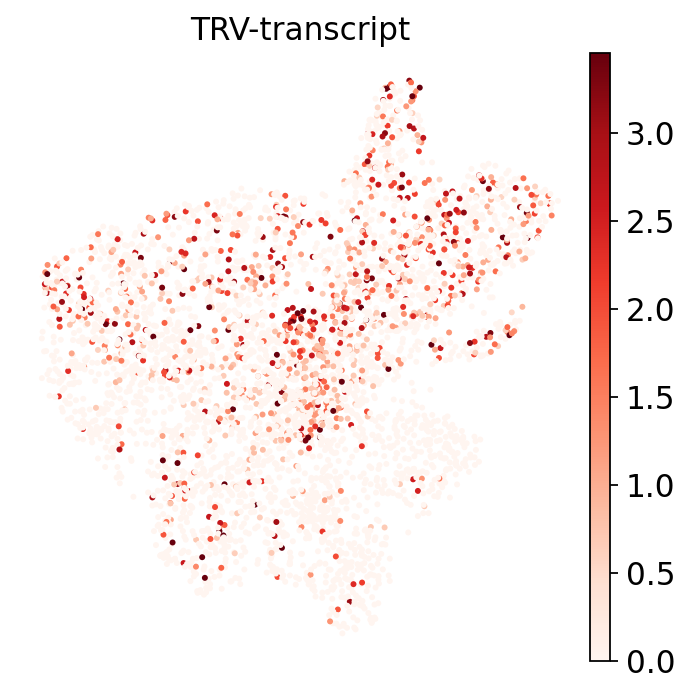

In [ ]:
sc.pl.umap(
        l1,
        color=marker_genes_in_data_l1['TRV'],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )

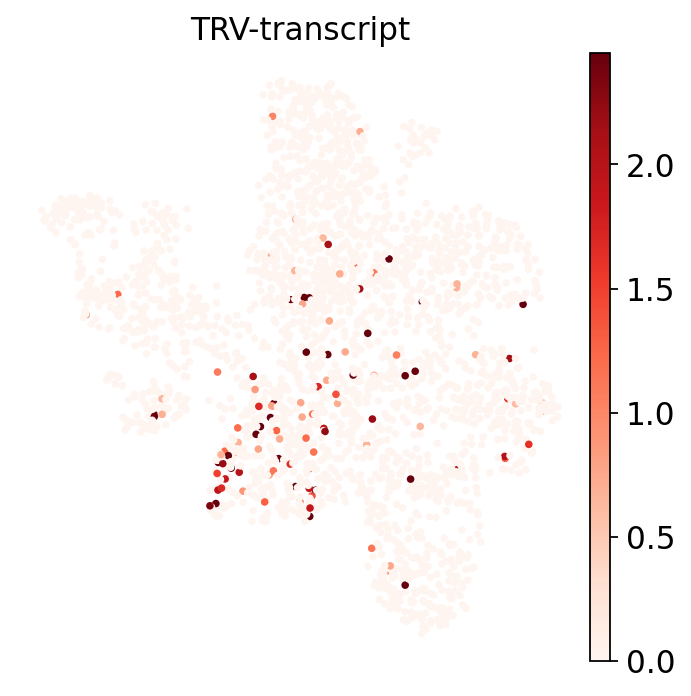

In [ ]:
sc.pl.umap(
        l2,
        color=marker_genes_in_data_l2['TRV'],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )

## Filter TRV-infected cells out of L2

In [ ]:
print(l1.n_obs)
print(l1[l1[: , 'TRV-transcript'].X > 0, :].n_obs) # count infected cells

4154
966


In [ ]:
print(l2.n_obs)
print(l2[l2[: , 'TRV-transcript'].X > 0, :].n_obs) # count infected cells

2566
109


In [ ]:
l2 = l2[l2[: , 'TRV-transcript'].X == 0, :].copy()


/opt/conda/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3577: SparseEfficiencyWarning: Comparing a sparse matrix with 0 using == is inefficient, try using != instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
l2.n_obs

2457

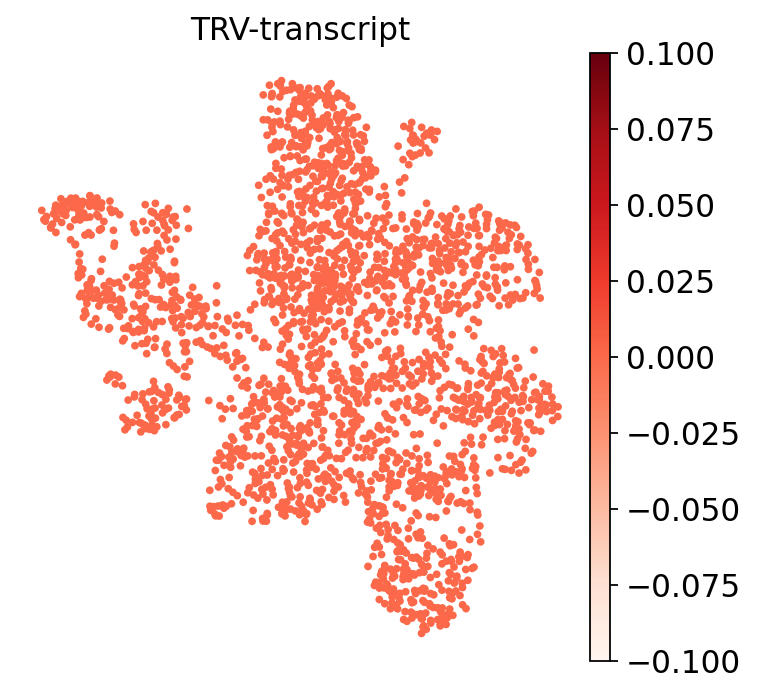

In [ ]:
sc.pl.umap(
        l2,
        color=marker_genes_in_data_l2['TRV'],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )

In [ ]:
l1.write("L1_annotation.h5ad")
l2.write("L2_annotation.h5ad")

## Virus-induced silencing of PDS3 (AT4G14210)

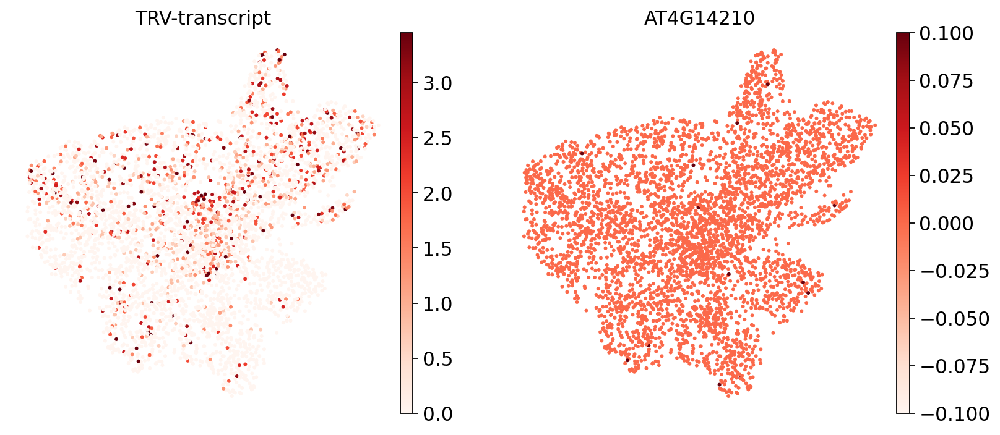

In [ ]:
sc.pl.umap(
        l1,
        color=['TRV-transcript', 'AT4G14210'],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )

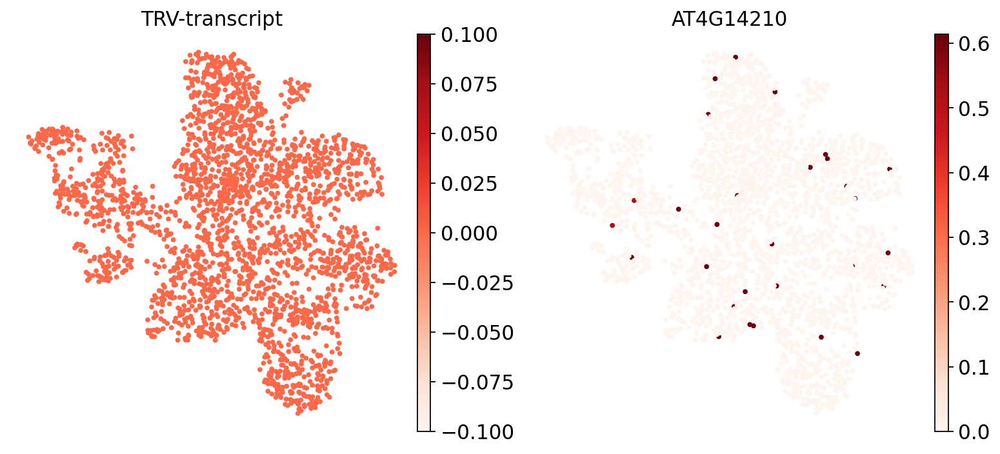

In [ ]:
sc.pl.umap(
        l2,
        color=['TRV-transcript', 'AT4G14210'],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )

## Marker genes

In [20]:
marker_genes = {
    'Shoot apical meristem': 
    ['AT5G22580', 'AT5G53210', 'AT3G06120', 'AT4G31805', 
     'AT5G54640', 'AT2G29570', 
    'AT2G27970', 'AT2G26760', 'AT1G02730', 
    'AT4G33270', 'AT4G33260', 'AT4G23800', 'AT5G47500', 
    'AT1G50490', 'AT1G18370'], 
    'Epidermal cells': 
    ['AT1G27950', 'AT5G23940'],
    # 'Guard cells':
    # ['AT2G46720', 'AT1G23200', 'AT5G26000', 'AT1G22690', 'AT3G53720', 
    # 'AT3G24140', 'AT5G65590', 'AT1G08810'], 
    # 'Xylem':
    # ['AT4G32880', 'AT5G19530', 'AT3G25710', 'AT5G03170', 'AT5G60490', 
    # 'AT1G71930', 'AT1G20850', 'AT4G35350'], 
    # 'Phloem':
    # ['AT4G13770', 'AT4G19840', 'AT5G57350', 'AT1G79430', 'AT3G01680', 
    # 'AT3G01670', 'AT1G29520', 'AT4G23410', 'AT3G48740', 'AT5G23660', 
    # 'AT5G24800', 'AT5G50800'],
    # '(Pro)cambium': ['AT1G46480', 'AT1G04240', 'AT5G61480', 'AT5G57130'],
'Mesophyll': ['AT4G12970', 'AT5G54270', 'AT5G38420', 'AT4G38970', 'AT1G76570', 'AT1G19150'],
'Heat shock': ['AT5G12030', 'AT3G12580', 'AT1G74310'],
'Defence-related': ['AT3G25770', 'AT3G25760', 'AT1G10370', 'AT4G18170'],
'Flower sepal': ['AT1G54500', 'AT3G45140', 'AT1G01320'], 
'Flower meristem': ['AT1G63100', 'AT3G51740', 'AT3G54340', 'AT4G31610'], 
# 'Anther': ['AT1G23520', 'AT5G08250', 'AT5G20030', 'AT2G16750']


    }


In [21]:
marker_genes_in_data_l1 = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in l1.var.index:
            markers_found.append(marker)
    marker_genes_in_data_l1[ct] = markers_found

marker_genes_in_data_l2 = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in l2.var.index:
            markers_found.append(marker)
    marker_genes_in_data_l2[ct] = markers_found

In [22]:
marker_genes_in_data_l1

{'Shoot apical meristem': ['AT5G22580',
  'AT5G54640',
  'AT2G29570',
  'AT2G27970',
  'AT1G50490'],
 'Epidermal cells': ['AT1G27950', 'AT5G23940'],
 'Mesophyll': ['AT5G54270',
  'AT5G38420',
  'AT4G38970',
  'AT1G76570',
  'AT1G19150'],
 'Heat shock': ['AT5G12030', 'AT3G12580', 'AT1G74310'],
 'Defence-related': ['AT3G25770', 'AT3G25760', 'AT1G10370', 'AT4G18170'],
 'Flower sepal': ['AT1G54500', 'AT3G45140', 'AT1G01320'],
 'Flower meristem': ['AT3G51740', 'AT3G54340']}

In [23]:
marker_genes_in_data_l2

{'Shoot apical meristem': ['AT5G22580',
  'AT5G54640',
  'AT2G29570',
  'AT2G27970',
  'AT1G50490'],
 'Epidermal cells': ['AT1G27950', 'AT5G23940'],
 'Mesophyll': ['AT5G54270', 'AT5G38420', 'AT4G38970'],
 'Heat shock': ['AT5G12030', 'AT3G12580', 'AT1G74310'],
 'Defence-related': ['AT3G25770', 'AT3G25760', 'AT1G10370', 'AT4G18170'],
 'Flower sepal': ['AT3G45140', 'AT1G01320'],
 'Flower meristem': ['AT3G54340']}

In [16]:
l1.layers["counts"] = l1.X
l1.X = l1.layers["scran_normalization"]
l1.var["highly_variable"] = l1.var["highly_deviant"]
sc.tl.pca(l1, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(l1)
sc.tl.umap(l1)

l2.layers["counts"] = l2.X
l2.X = l2.layers["scran_normalization"]
l2.var["highly_variable"] = l2.var["highly_deviant"]
sc.tl.pca(l2, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(l2)
sc.tl.umap(l2)

/opt/conda/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)
/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/opt/conda/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


In [24]:
cell_cts = ['Shoot apical meristem', 'Epidermal cells', 
            'Mesophyll', 
            'Heat shock', 'Defence-related',
            'Flower sepal', 'Flower meristem']

SHOOT APICAL MERISTEM:


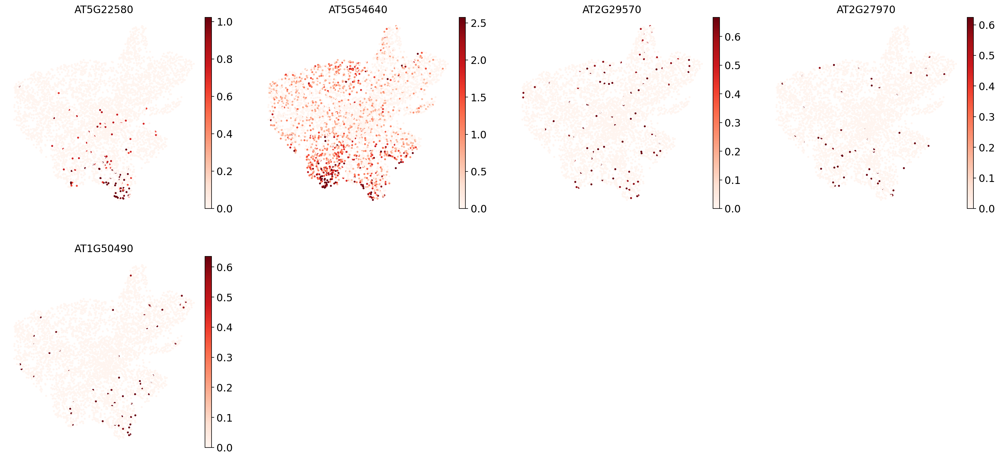





EPIDERMAL CELLS:


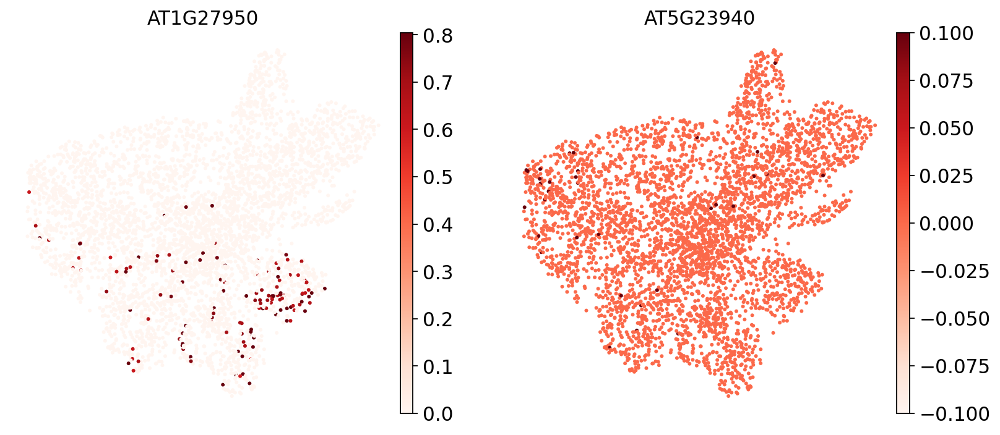





MESOPHYLL:


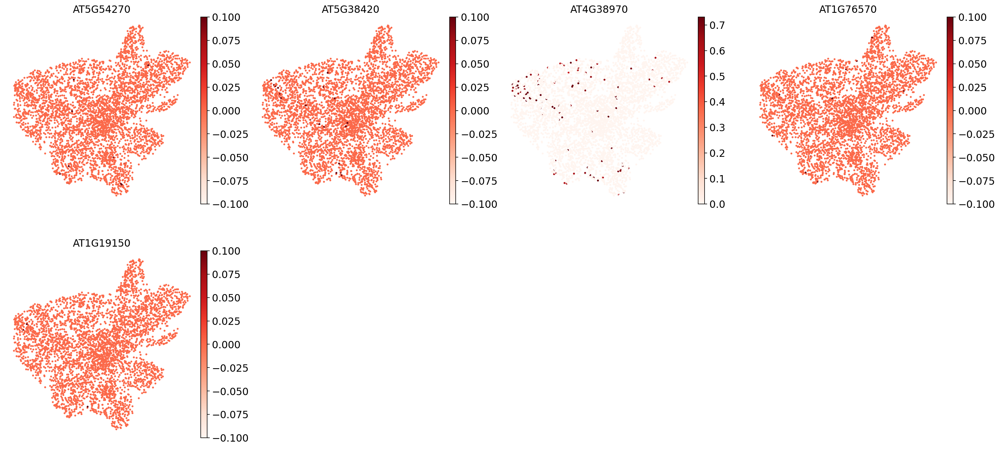





HEAT SHOCK:


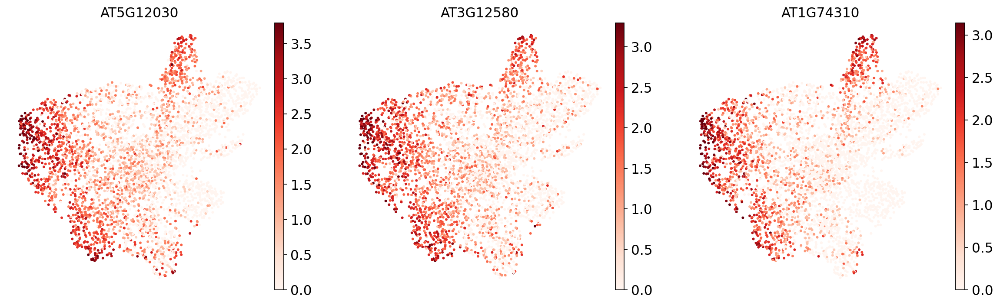





DEFENCE-RELATED:


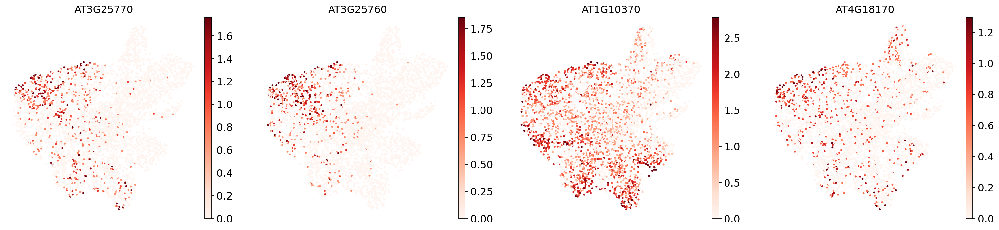





FLOWER SEPAL:


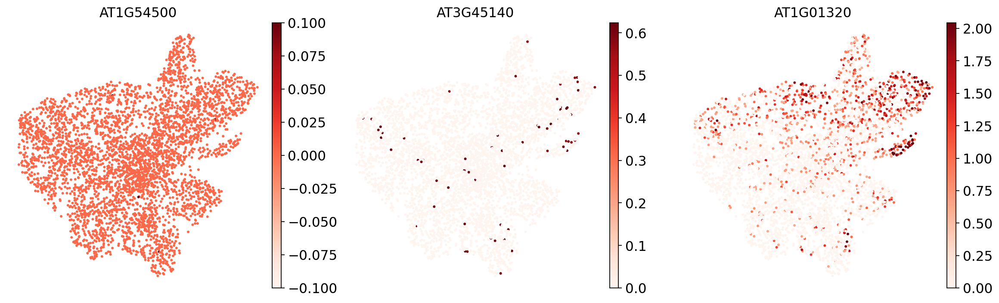





FLOWER MERISTEM:


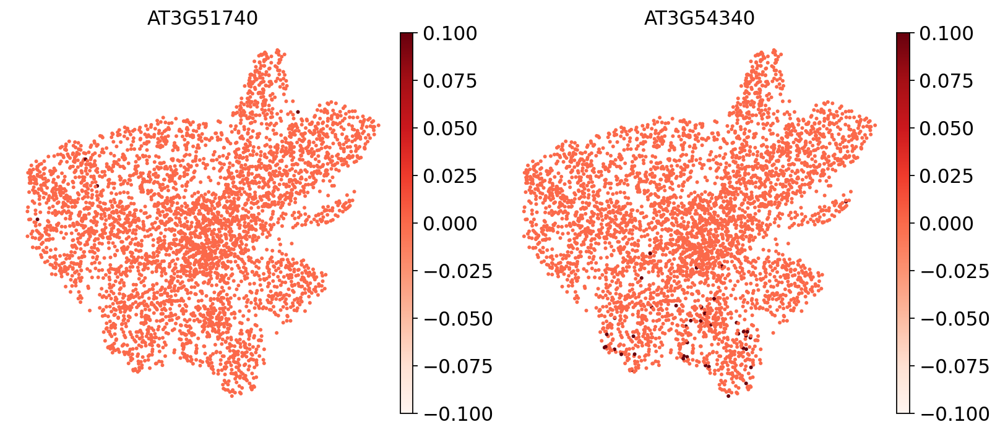

In [25]:
for ct in cell_cts:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        l1,
        color=marker_genes_in_data_l1[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

SHOOT APICAL MERISTEM:


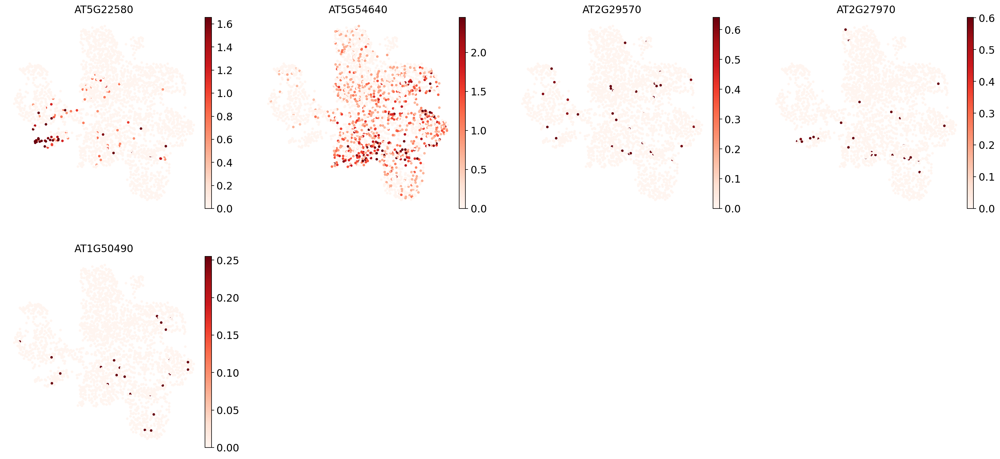





EPIDERMAL CELLS:


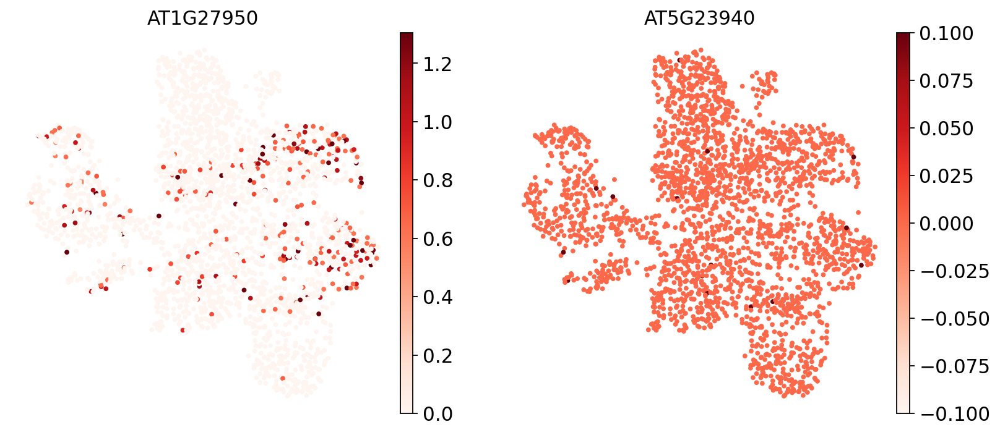





MESOPHYLL:


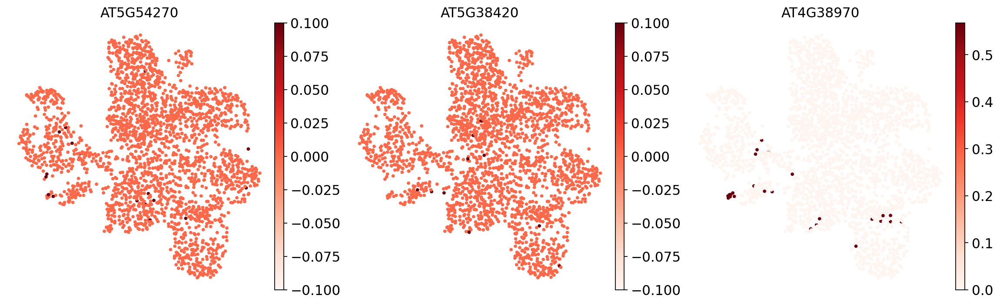





HEAT SHOCK:


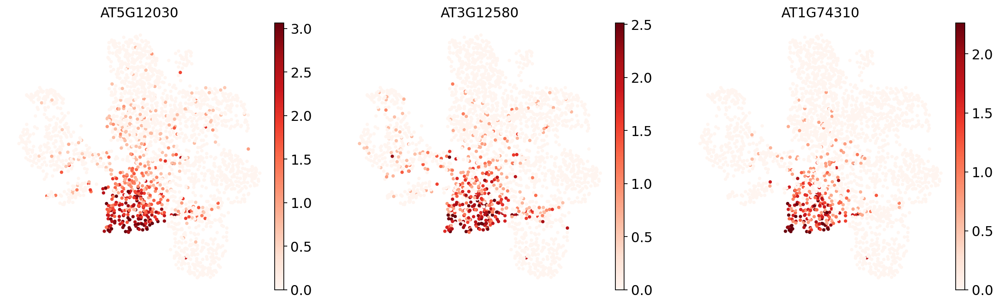





DEFENCE-RELATED:


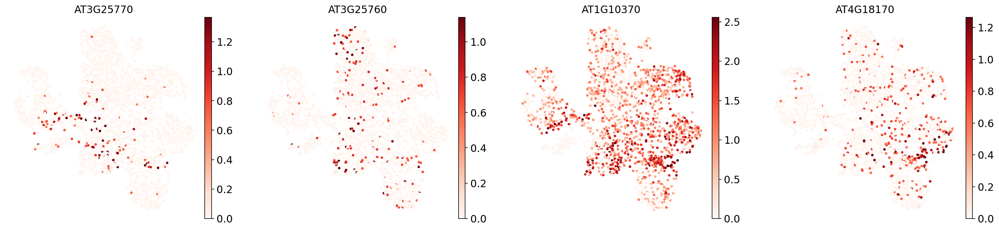





FLOWER SEPAL:


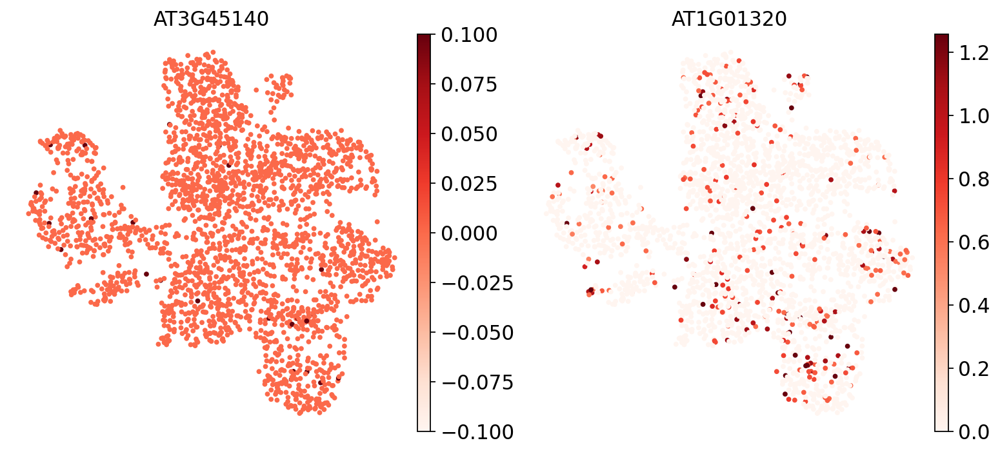





FLOWER MERISTEM:


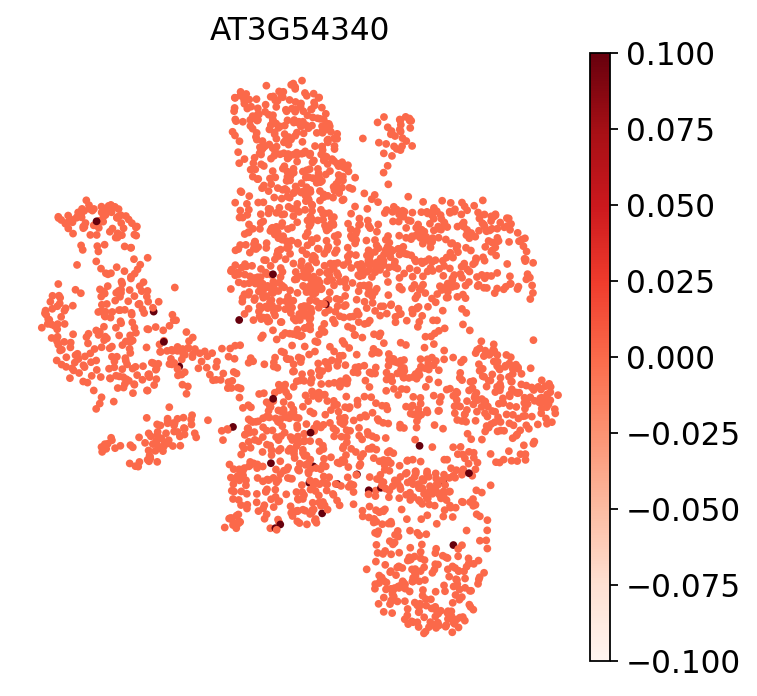

In [26]:
for ct in cell_cts:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        l2,
        color=marker_genes_in_data_l2[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

## From clusters to diff expressed genes

In [ ]:
sc.tl.rank_genes_groups(
    l1, groupby="leiden_res1", method="wilcoxon", key_added="dea_leiden_1"
)

sc.tl.rank_genes_groups(
    l2, groupby="leiden_res1", method="wilcoxon", key_added="dea_leiden_1"
)

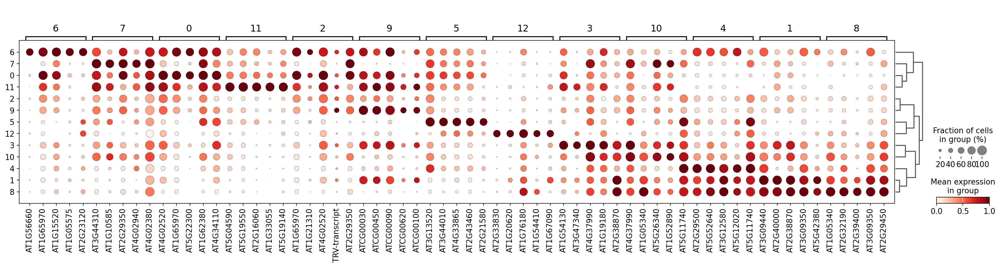

In [ ]:
sc.pl.rank_genes_groups_dotplot(
    l1, groupby="leiden_res1", standard_scale="var", n_genes=5, key="dea_leiden_1"
)

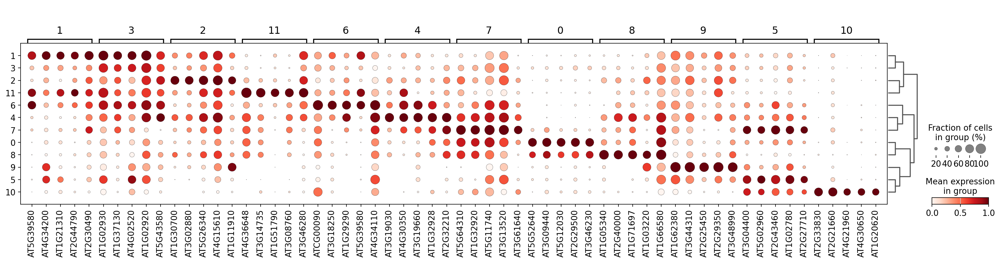

In [ ]:
sc.pl.rank_genes_groups_dotplot(
    l2, groupby="leiden_res1", standard_scale="var", n_genes=5, key="dea_leiden_1"
)

In [ ]:
l1.write("L1_annotation.h5ad")
l2.write("L2_annotation.h5ad")

In [ ]:
sc.tl.filter_rank_genes_groups(
    l1,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_1",
    key_added="dea_leiden_1_filtered",
)

sc.tl.filter_rank_genes_groups(
    l2,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_1",
    key_added="dea_leiden_1_filtered",
)

categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 3, etc.


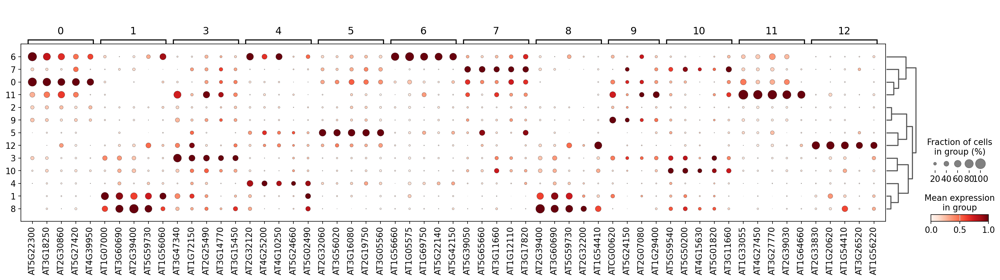

In [ ]:
sc.pl.rank_genes_groups_dotplot(
    l1,
    groupby="leiden_res1",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_1_filtered",
)

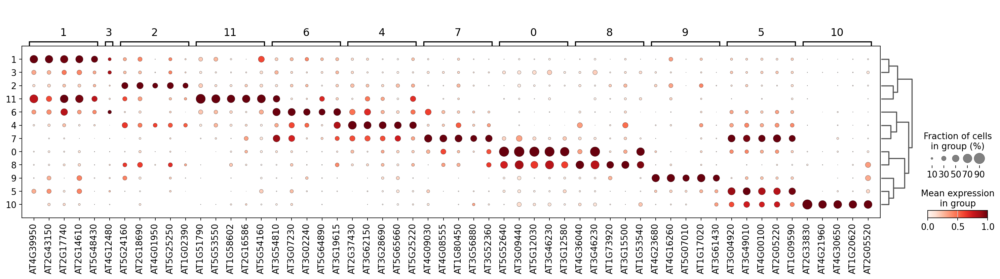

In [ ]:
sc.pl.rank_genes_groups_dotplot(
    l2,
    groupby="leiden_res1",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_1_filtered",
)

In [ ]:
del l1.uns['dea_leiden_1_filtered'] # cannot be saved in adata
del l2.uns['dea_leiden_1_filtered']

In [4]:
l1 = sc.read_h5ad(
    filename="L1_annotation.h5ad"
)
l2 = sc.read_h5ad(
    filename="L2_annotation.h5ad"
)

In [5]:
cl_annotation_l2 = {
    "0": "Unknown / Xylem / Stress response / Phloem", 
    "1": "Mesophyll",
    "2": "Leaf pavement cell / Unknown / Leaf epidermis",
    "3": "Mesophyll",
    "4": "Xylem / Phloem parenchyma",
    "5": "Leaf pavement cell / Meristematic cells / Mesophyll / Xylem pole pericycle", 
    "6": "Xylem", 
    "7": "Phloem parenchyma / Xylem", 
    "8": "Unknown / Xylem / Stress response / Phloem",
    "9": "Unknown / Xylem",
    "10": "Leaf pavement cell / Xylem pole pericycle",
    "11": "Mesophyll",  
}

In [6]:
cl_annotation_l1 = {
    "0": "Leaf guard cell / Vascular tissue", 
    "1": "Leaf pavement cell",
    "2": "Unknown",
    "3": "Unknown / Xylem / Spongy mesophyll",
    "4": "Unknown / Leaf guard cell / Phloem parenchyma",
    "5": "S phase / G2/M phase / Unknown / Phloem parenchyma", 
    "6": "Leaf guard cell / Unknown", 
    "7": "Unknown / Leaf guard cell / Leaf pavement cell", 
    "8": "Leaf pavement cell",
    "9": "Unknown",
    "10": "Leaf pavement cell / Unknown / Hydathodes / S phase",
    "11": "Hypoxia-associated / Xylem / Mesophyll / Leaf guard cell / Phloem pole pericycle", 
    "12": "Leaf pavement / Phloem parenchyma / Bundle sheath" 
}

In [7]:
l2.obs["manual_celltype_annotation"] = l2.obs.leiden_res1.map(cl_annotation_l2)
l1.obs["manual_celltype_annotation"] = l1.obs.leiden_res1.map(cl_annotation_l1)

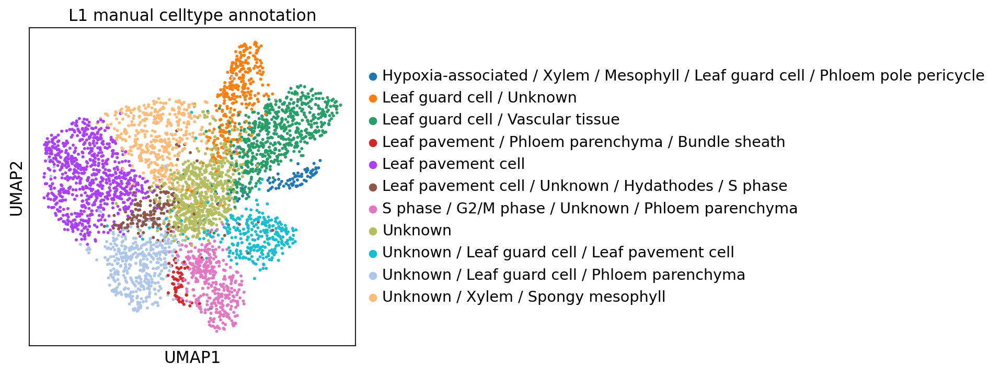

In [11]:
sc.pl.umap(l1, color=["manual_celltype_annotation"], title='L1 manual celltype annotation')

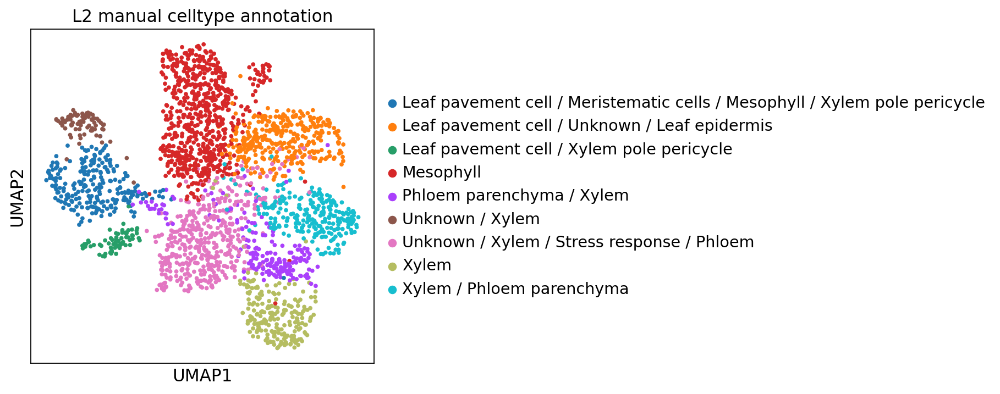

In [12]:
sc.pl.umap(l2, color=["manual_celltype_annotation"], title='L2 manual celltype annotation')

In [15]:
l1.write("L1_annotation.h5ad")
l2.write("L2_annotation.h5ad")